<a href="https://colab.research.google.com/github/laboratoriodecodigos/Colab-Python/blob/main/%C2%BFEl_modelo_preentrenado_NO_clasifica_tus_datos_como_quieres%3F.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -q roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.8/302.8 kB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.4/5.4 MB 33.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.4/58.4 kB 3.4 MB/s eta 0:00:00


In [2]:
from google.colab import userdata
from roboflow import Roboflow

# Obtener API Key desde Colab Secrets
ROBOFLOW_API_KEY = userdata.get("ROBOFLOW")

# Conectarse a Roboflow
rf = Roboflow(api_key=ROBOFLOW_API_KEY)

# Proyecto
project = rf.workspace("material-identification").project(
    "garbage-classification-3"
)

# Versión 2
version = project.version(2)

# Descargar en formato YOLO26
dataset = version.download("yolo26")

print("Dataset descargado en:")
print(dataset.location)

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to GARBAGE-CLASSIFICATION-3-2 in yolo26:: 100%|██████████| 20940/20940 [00:02<00:00, 8946.71it/s]


Dataset descargado en:
/content/GARBAGE-CLASSIFICATION-3-2


In [3]:
import os
print(os.listdir(dataset.location))

['README.dataset.txt', 'valid', 'test', 'README.roboflow.txt', 'data.yaml', 'train']


In [4]:
!pip install -q ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.5/46.5 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 69.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.1/78.1 kB 8.9 MB/s eta 0:00:00


In [5]:
for split in ["train", "valid", "test"]:

    image_dir = os.path.join(
        dataset.location,
        split,
        "images"
    )

    if os.path.exists(image_dir):
        images = [
            f for f in os.listdir(image_dir)
            if f.lower().endswith((".jpg", ".jpeg", ".png"))
        ]

        print(f"{split}: {len(images)} imágenes")

train: 7324 imágenes
valid: 2098 imágenes
test: 1042 imágenes


In [6]:
import yaml

yaml_path = os.path.join(
    dataset.location,
    "data.yaml"
)

with open(yaml_path, "r") as f:
    data = yaml.safe_load(f)

print("Clases:")

for i, name in enumerate(data["names"]):
    print(i, "→", name)

Clases:
0 → BIODEGRADABLE
1 → CARDBOARD
2 → GLASS
3 → METAL
4 → PAPER
5 → PLASTIC


In [20]:
for key, value in data.items():
    print(f"{key}: {value}")

train: ../train/images
val: ../valid/images
test: ../test/images
nc: 6
names: ['BIODEGRADABLE', 'CARDBOARD', 'GLASS', 'METAL', 'PAPER', 'PLASTIC']
roboflow: {'workspace': 'material-identification', 'project': 'garbage-classification-3', 'version': 2, 'license': 'CC BY 4.0', 'url': 'https://universe.roboflow.com/material-identification/garbage-classification-3/dataset/2'}


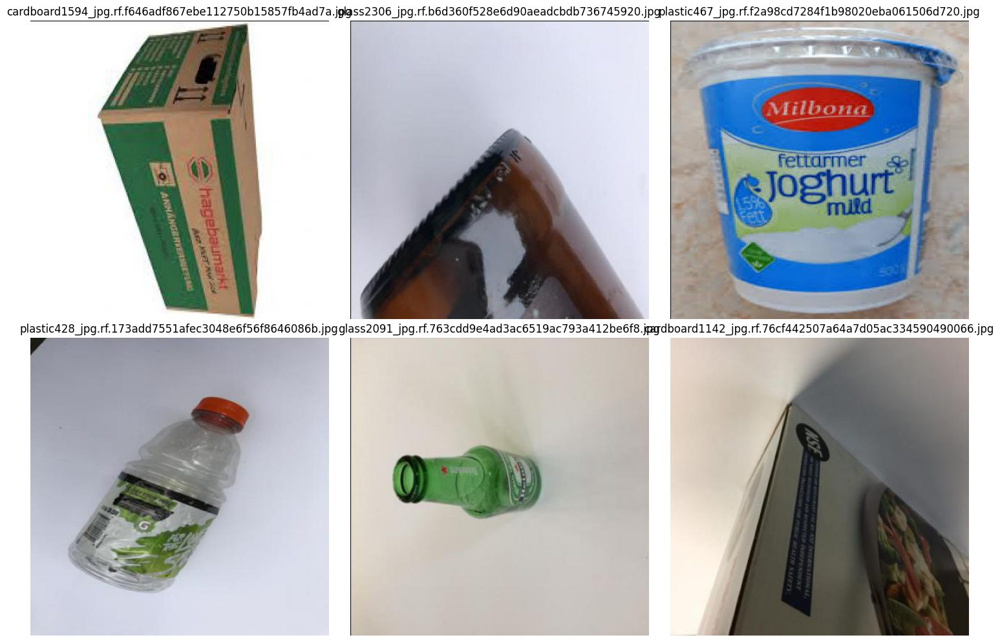

In [8]:
import matplotlib.pyplot as plt
import random
from PIL import Image

image_dir = os.path.join(
    dataset.location,
    "train",
    "images"
)
images = [
    f for f in os.listdir(image_dir)
    if f.lower().endswith((".jpg", ".jpeg", ".png"))]

sample_images = random.sample(
    images,
    min(6, len(images)))

plt.figure(figsize=(15, 10))

for i, filename in enumerate(sample_images):
    image_path = os.path.join(
        image_dir,
        filename)

    image = Image.open(image_path)
    plt.subplot(2, 3, i + 1)
    plt.imshow(image)
    plt.title(filename)
    plt.axis("off")
plt.tight_layout()
plt.show()

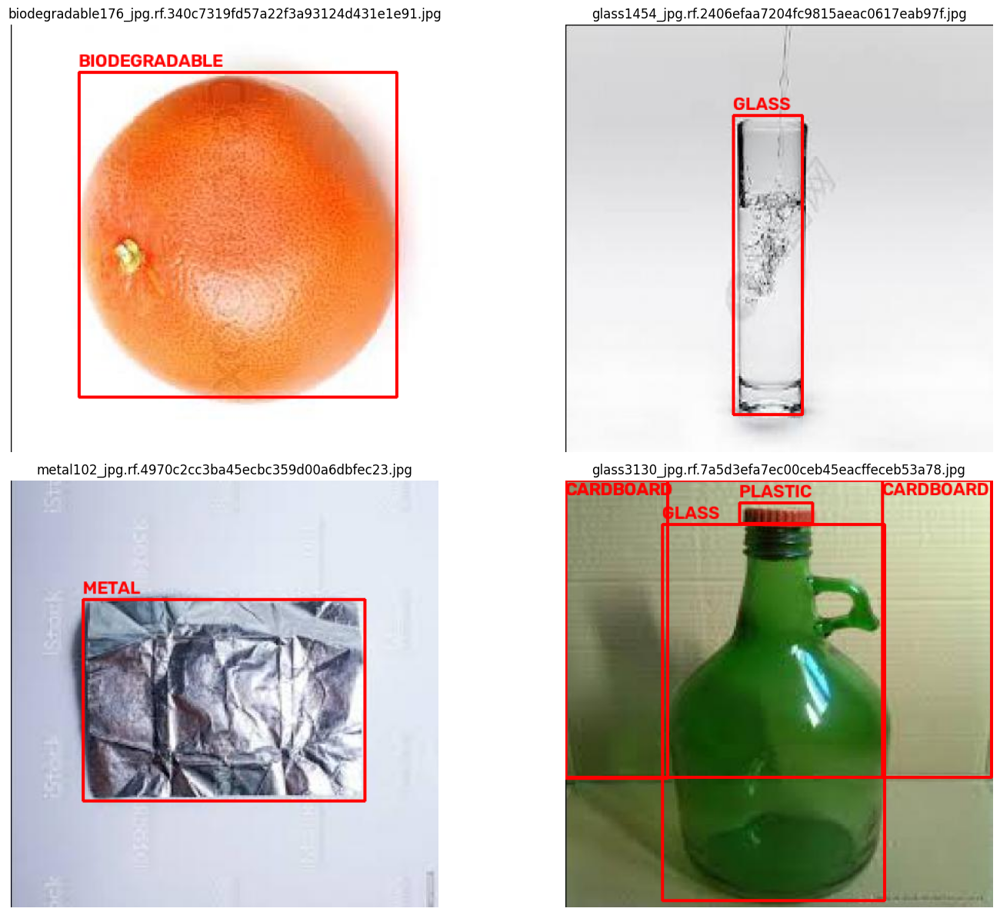

In [10]:
import cv2
import matplotlib.pyplot as plt
import random

class_names = data["names"]

image_dir = os.path.join(
    dataset.location,
    "train",
    "images"
)

label_dir = os.path.join(
    dataset.location,
    "train",
    "labels"
)

images = [
    f for f in os.listdir(image_dir)
    if f.lower().endswith((".jpg", ".jpeg", ".png"))
]

sample_images = random.sample(
    images,
    min(4, len(images))
)

plt.figure(figsize=(16, 12))

for i, filename in enumerate(sample_images):

    image_path = os.path.join(
        image_dir,
        filename
    )

    label_path = os.path.join(
        label_dir,
        os.path.splitext(filename)[0] + ".txt"
    )

    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    h, w, _ = image.shape

    if os.path.exists(label_path):

        with open(label_path, "r") as f:

            for line in f:

                values = line.strip().split()

                if len(values) != 5:
                    continue

                class_id, x, y, bw, bh = map(float, values)

                x1 = int((x - bw / 2) * w)
                y1 = int((y - bh / 2) * h)

                x2 = int((x + bw / 2) * w)
                y2 = int((y + bh / 2) * h)

                cv2.rectangle(
                    image,
                    (x1, y1),
                    (x2, y2),
                    (255, 0, 0),
                    2
                )

                label = class_names[int(class_id)]

                cv2.putText(
                    image,
                    label,
                    (x1, max(y1 - 5, 15)),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    0.6,
                    (255, 0, 0),
                    2
                )

    plt.subplot(2, 2, i + 1)
    plt.imshow(image)
    plt.axis("off")
    plt.title(filename)

plt.tight_layout()
plt.show()

In [11]:
from ultralytics import YOLO

model = YOLO("yolo26n.pt")

Creating new Ultralytics Settings v0.0.8 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/usage/settings.


In [12]:
results = model.train(
    data=f"{dataset.location}/data.yaml",
    epochs=5,
    imgsz=640,
    batch=16,
    device=0
)

Ultralytics 8.4.154 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/GARBAGE-CLASSIFICATION-3-2/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=5, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo26n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train, nbs=64, nms=None, opset=

In [13]:
# Define the path to the directory, corrected based on the training output
post_training_files_path = '/content/runs/detect/train'

# List the files in the directory
!ls {post_training_files_path}

args.yaml			 labels.jpg		val_batch0_pred.jpg
BoxF1_curve.png			 results.csv		val_batch1_labels.jpg
BoxP_curve.png			 results.png		val_batch1_pred.jpg
BoxPR_curve.png			 train_batch0.jpg	val_batch2_labels.jpg
BoxR_curve.png			 train_batch1.jpg	val_batch2_pred.jpg
confusion_matrix_normalized.png  train_batch2.jpg	weights
confusion_matrix.png		 val_batch0_labels.jpg


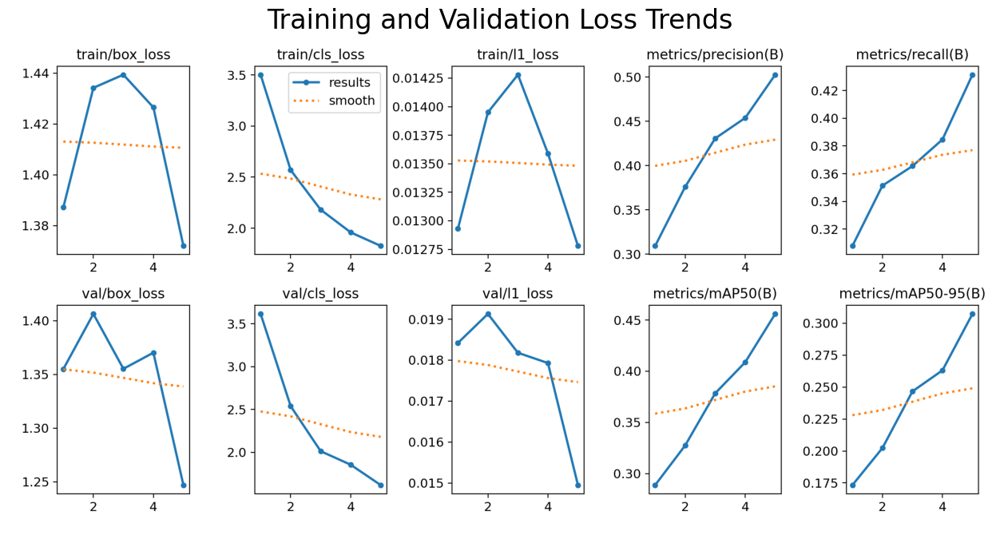

In [14]:
results_file_path = os.path.join(post_training_files_path, 'results.png')

image = cv2.imread(results_file_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display the image
plt.figure(figsize=(20, 8))
plt.imshow(image)
plt.title('Training and Validation Loss Trends', fontsize=24)
plt.axis('off')
plt.show()

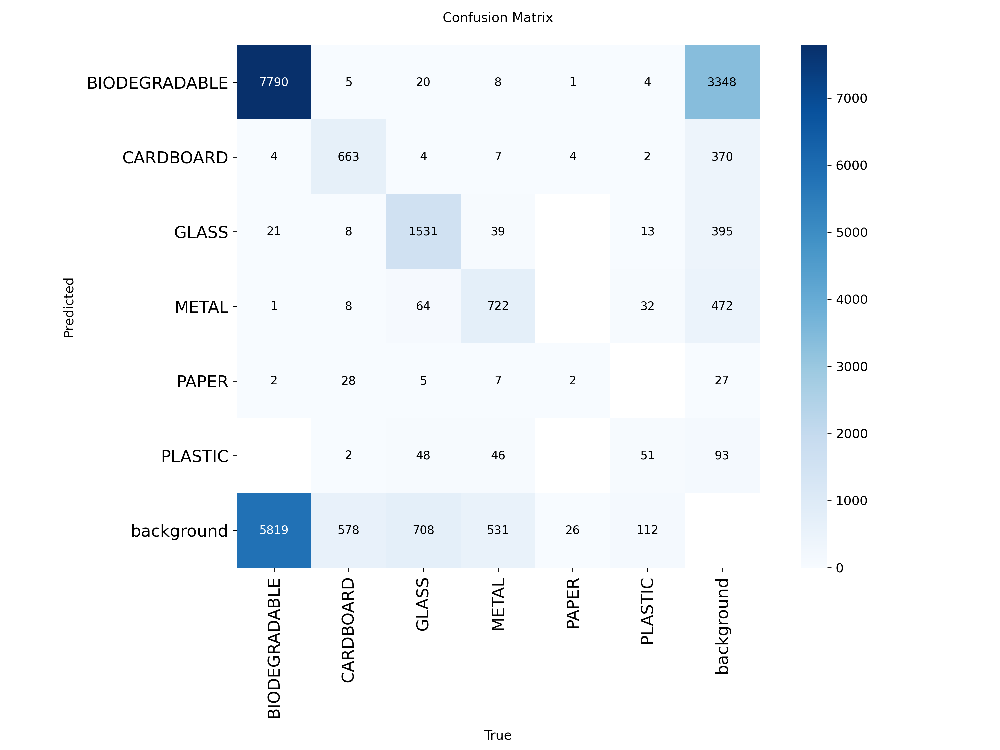

In [15]:
from IPython.display import Image, display

display(
    Image(
        filename="/content/runs/detect/train/confusion_matrix.png"
    )
)


image 1/1 /content/GARBAGE-CLASSIFICATION-3-2/valid/images/cardboard972_jpg.rf.8e41b35c421b3e0b5d94d036ab083b63.jpg: 640x640 4 CARDBOARDs, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/GARBAGE-CLASSIFICATION-3-2/valid/images/cardboard218_jpg.rf.f95bea1053f5a76cea14ea61fdac4e87.jpg: 640x640 1 CARDBOARD, 10.3ms
Speed: 1.7ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/GARBAGE-CLASSIFICATION-3-2/valid/images/cardboard752_jpg.rf.8f56f7f1634c17fdcd0a633bfeab02bd.jpg: 640x640 1 CARDBOARD, 11.2ms
Speed: 1.8ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/GARBAGE-CLASSIFICATION-3-2/valid/images/biodegradable545_jpg.rf.221b16c94387b66692f4e25e3c67c662.jpg: 640x640 1 BIODEGRADABLE, 10.5ms
Speed: 2.1ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content

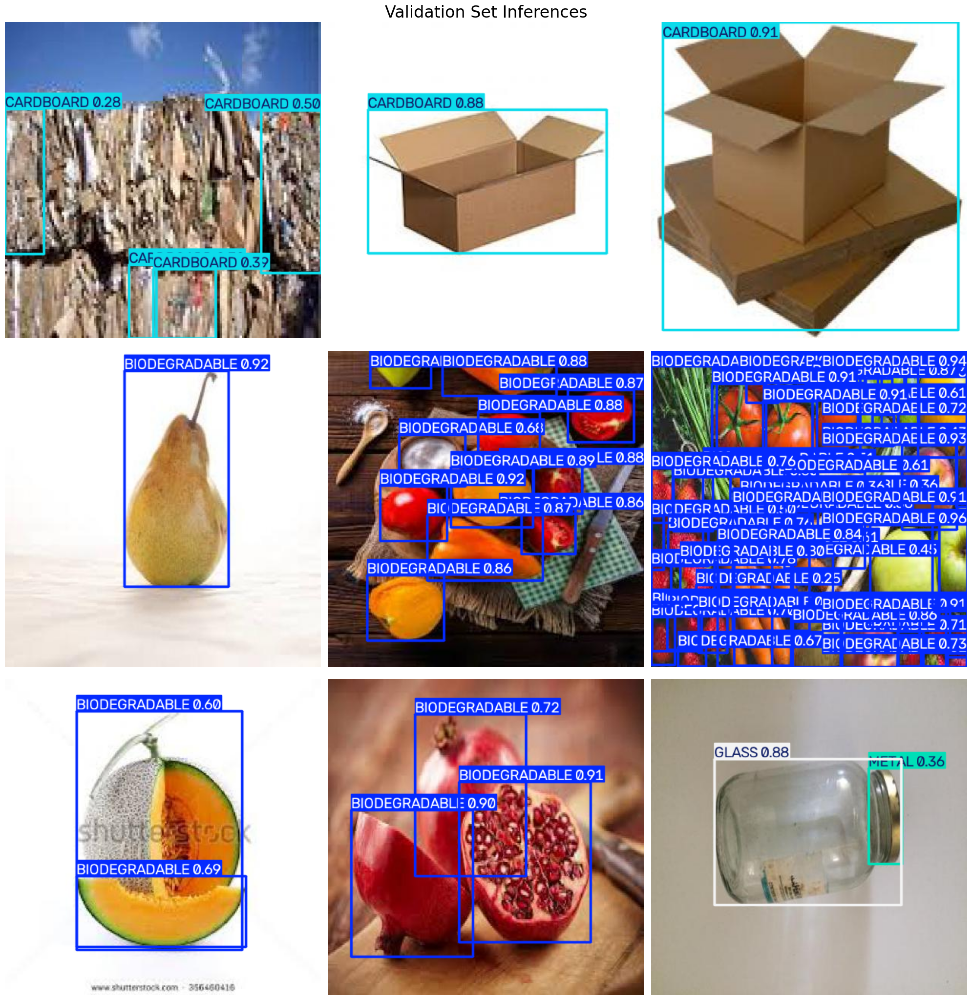

In [17]:
# Define the path to the validation images
valid_images_path = os.path.join(dataset.location, 'valid', 'images')

# List all jpg images in the directory
image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]

# Select 9 images at equal intervals
num_images = len(image_files)
selected_images = [image_files[i] for i in range(0, num_images, num_images // 9)]

# Initialize the subplot
fig, axes = plt.subplots(3, 3, figsize=(20, 21))
fig.suptitle('Validation Set Inferences', fontsize=24)

# Perform inference on each selected image and display it
for i, ax in enumerate(axes.flatten()):
    image_path = os.path.join(valid_images_path, selected_images[i])
    results = model.predict(source=image_path, imgsz=640)
    annotated_image = results[0].plot()
    annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
    ax.imshow(annotated_image_rgb)
    ax.axis('off')
plt.tight_layout()
plt.show()

In [21]:
import os

# The training results were saved in '/content/runs/detect/train'
# The best model weights are typically saved in the 'weights' subdirectory
best_model_path = os.path.join(post_training_files_path, 'weights', 'best.pt')

print(f"The 'best.pt' file is located at: {best_model_path}")

# You can also verify its existence
if os.path.exists(best_model_path):
    print("File 'best.pt' exists at this location.")
else:
    print("File 'best.pt' was not found at this location.")

The 'best.pt' file is located at: /content/runs/detect/train/weights/best.pt
File 'best.pt' exists at this location.


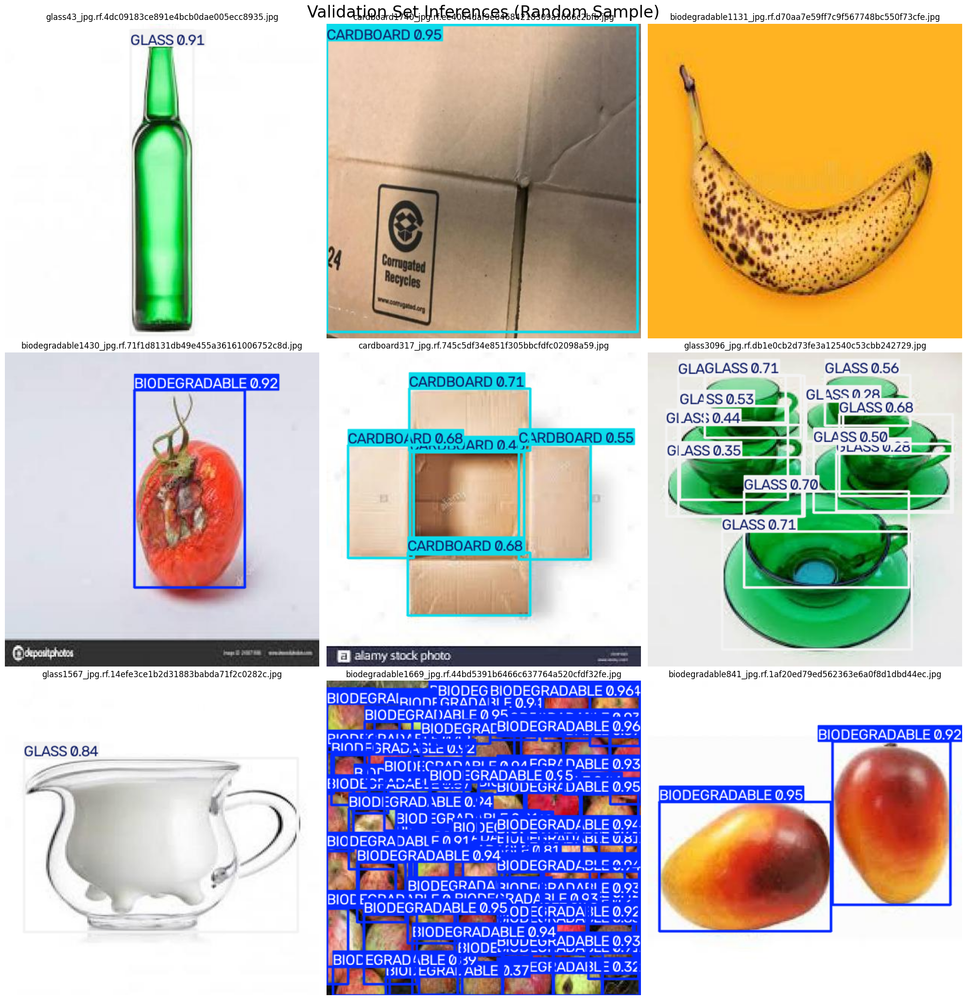

In [22]:
import os
import cv2
import matplotlib.pyplot as plt
import random
from ultralytics import YOLO # Assuming YOLO is already loaded in a previous cell

# Define the path to the validation images
valid_images_path = os.path.join(dataset.location, 'valid', 'images')

# List all jpg images in the directory
image_files = [file for file in os.listdir(valid_images_path) if file.lower().endswith(('.jpg', '.jpeg', '.png'))]

# Select 9 random images (or fewer if less than 9 are available)
num_to_sample = min(9, len(image_files))
selected_images = random.sample(image_files, num_to_sample)

# Initialize the subplot
fig, axes = plt.subplots(3, 3, figsize=(20, 21))
fig.suptitle('Validation Set Inferences (Random Sample)', fontsize=24)

# Flatten axes for easy iteration and handle cases where num_to_sample < 9
for i, ax in enumerate(axes.flatten()):
    if i < num_to_sample:
        image_path = os.path.join(valid_images_path, selected_images[i])
        results = model.predict(source=image_path, imgsz=640, verbose=False)
        annotated_image = results[0].plot()
        annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
        ax.imshow(annotated_image_rgb)
        ax.set_title(selected_images[i])
        ax.axis('off')
    else:
        ax.axis('off') # Turn off unused subplots

plt.tight_layout()
plt.show()